In [1]:
import numpy as np
import random
import itertools as it
import os, subprocess
import sys
import time
import pickle

import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib as mpl
from mpl_toolkits.mplot3d import Axes3D
from mycolorpy import colorlist as mcp

import proplot as pplt

from UQpy.distributions import Normal, Uniform, JointIndependent

import scipy
from scipy.integrate import odeint
import scipy.special

import SALib
from SALib.sample import saltelli

sys.path.append('../GSA_GDM_PCE/')
from DimensionReduction import Grassmann
from DimensionReduction import DiffusionMaps
from GDMaps_PCE_GSA import *

# Plotting parameters
mpl.rcParams["figure.dpi"] = 100
mpl.rcParams["legend.fontsize"] = 12.5
mpl.rcParams["font.size"] = 13.5
mpl.rcParams["axes.grid"] = True
mpl.rcParams["grid.alpha"] = 0.2
mpl.rcParams["axes.axisbelow"] = True
mpl.rcParams["figure.figsize"] = (6, 4)
mpl.rcParams["mathtext.fontset"] = "stix" # "cm"
mpl.rcParams['axes.labelsize'] = 15
mpl.rcParams['axes.titlesize'] = 15

USE_TEX = False

if USE_TEX:
    plt.rc("text", usetex=True)
    plt.rc("text.latex", preamble=r"""
     \usepackage{times}
     \usepackage{mathptmx}""")
else:
    plt.rc("text", usetex=False)
    
plt.rc("font", family="serif")

mpl.rcParams['text.latex.preamble']=[r"\usepackage{amsmath}"]


In [2]:
if not os.path.exists('plots'):
    os.makedirs('plots')

In [3]:
samples       = np.asarray(range(1024*7))
response_vars = ['SUSCEPTIBLE', 'HOSPITALIZED', 'DEATH', 'RECOVERED', 'ACTIVE']

num_steps     = 180
num_runs      = 20
num_responses = len(response_vars)
num_samples   = len(samples)


In [4]:
with open('input_data/results_all_array.pickle', 'rb') as f:
    results_all = pickle.load(f)

In [5]:
print(results_all.shape)

(20, 7168, 5, 180)


In [6]:
# input pararameters
problem = {
  'num_vars': 5, 
  'names': ['R', 
            'SFSusceptibility_Scalar', 
            'SFInfector_Scalar', 
            'B_n_Scalar',
            'lam_gamma_Scalar'],
  'bounds': [[1.9, 6.5], 
             [0.5, 1.5],
             [0.5, 1.5], 
             [0.7, 1.3],
             [0.7, 1.3]]
}

param_names_short = {'R': r'$R$',
            'SFSusceptibility_Scalar': r'$S_F$', 
            'SFInfector_Scalar': r'$A_F$',
            'B_n_Scalar': r'$B_F$',
            'lam_gamma_Scalar': r'$\Gamma_F$', 
}

In [7]:
n_distinct_samples = 2048 #1024

param_vals = saltelli.sample(problem, n_distinct_samples, calc_second_order=False)
saltelli_2048 = np.loadtxt('input_data/saltellisample_2048')

print(np.array_equal(param_vals, param_vals))


True


In [8]:
# Probability distributions of input parameters
# corresponding to the bounds 
print(f'Problem bounds: {problem["bounds"]}')

pdf1 = Uniform(loc=1.9, scale=4.6)  
pdf2 = Uniform(loc=0.5, scale=1.0)  
pdf3 = Uniform(loc=0.5, scale=1.0)
pdf4 = Uniform(loc=0.7, scale=0.6)
pdf5 = Uniform(loc=0.7, scale=0.6)

margs = [pdf1, pdf2, pdf3, pdf4, pdf5]
joint = JointIndependent(marginals=margs)

Problem bounds: [[1.9, 6.5], [0.5, 1.5], [0.5, 1.5], [0.7, 1.3], [0.7, 1.3]]


# Five response variables

In [9]:
# Flatten results

results_flat_run_all = {}

for run in range(num_runs):
    results_flat = np.zeros((num_samples, num_responses*num_steps))
    for sample_idx, sample in enumerate(samples):
        results_flat[sample_idx, :] = results_all[run][sample_idx].ravel()
    results_flat_run_all[run] = results_flat 
    

In [10]:
n2 = results_flat_run_all[0].shape[1]

In [11]:
# Input used in running DeepABM: 1024*7
saltelli_1024 = saltelli_2048[:num_samples]


# Writing data for the entire data

In [12]:
# Ranks to plot as histogram
ranks = []

for i in range(num_runs):
    data_all = results_flat_run_all[i].reshape(-1, 
                               int(np.sqrt(n2)), 
                               int(np.sqrt(n2)))
    
    ranks += [np.linalg.matrix_rank(data_all[i]) for i \
         in range(len(data_all))]

unique, counts = np.unique(ranks, return_counts=True)
print(f'Ranks: \n {np.asarray((unique, counts)).T}')


Ranks: 
 [[    2  2430]
 [    3 14544]
 [    4  3128]
 [    5  3795]
 [    6  1797]
 [    7  1654]
 [    8   804]
 [    9   668]
 [   10   711]
 [   11  1016]
 [   12  1833]
 [   13  8385]
 [   14  6718]
 [   15  7422]
 [   16  7324]
 [   17  9361]
 [   18  7000]
 [   19  6952]
 [   20  6442]
 [   21  7333]
 [   22  9554]
 [   23 14995]
 [   24 12148]
 [   25  7346]]


In [13]:
# List of Grassmannian dimensions p (top unique values from ranks)
p_array = [3, 13, 17, 22, 23, 24]

In [14]:
# parsimonious representation
max_degree = 25

if not os.path.exists('GSA_results'):
    os.makedirs('GSA_results')

    
for p in p_array:
    print(f'p={p}')

    if not os.path.exists(f'GSA_results/parsim/PCE{max_degree}/parsim_1024_input_20_runs_PCE_{max_degree}_p_{p}.npz'):
    
        result = run_PCE_GSA_on_mainfold(p=p, 
                                         data=results_flat_run_all, 
                                         x=saltelli_1024, 
                                         num_runs=20, 
                                         num_params=5, 
                                         n_keep=3, 
                                         dist_obj=joint, 
                                         pce_max_degree=max_degree, 
                                         parsim=True)

        np.savez(f'GSA_results/parsim_1024_input_20_runs_PCE_15_p_3.npz', 
                 x1 = result[0],  # pce_total_Si
                 x2 = result[1],  # pce_first_Si
                 x3 = result[2],  # pce_gto_Si
                 x4 = result[3],  # pce_gfo_Si
                 x5 = result[4],  # evals_diff_runs
                 x6 = result[5],  # evecs_diff_runs
                 x7 = result[6],  # coord_diff_runs
                 x8 = result[7],  # g_diff_runs
                 x9 = result[8],  # residuals_diff_runs
                 x10 = result[9],  # index_diff_runs
                 x11 = result[10],  # pce_error_diff_runs
                 x12 = result[11],  # pce_mean_diff_runs
                 x13 = result[12],  # pce_std_diff_runs
                )
    
# Note that for non-parsimonious data residuals_diff_runs, index_diff_runs are empty         
            

p=3
p=13
p=17
p=22
p=23
p=24


In [15]:
# using GDMaps data for p={3, 13, 17, 22, 23, 24} 
# rewriting pce with max_degree=20 

max_degree = 20 # 10, 15

p_array = [3, 13, 17, 22, 23, 24]

if not os.path.exists(f'GSA_results/PCE{max_degree}'):
    os.makedirs(f'GSA_results/PCE{max_degree}')

for p in p_array:
    print(f'p={p}')
    
    if not os.path.exists(f'GSA_results/parsim/PCE{max_degree}/parsim_1024_input_20_runs_PCE_{max_degree}_p_{p}.npz'):
    
        file_res = np.load(f'GSA_results/parsim/PCE25/parsim_1024_input_20_runs_PCE_25_p_{p}.npz', 
                           allow_pickle=True)

        evals_diff_runs = file_res['x5'] # evals_diff_runs
        evecs_diff_runs = file_res['x6'] # evecs_diff_runs
        coord_diff_runs = file_res['x7'] # coord_diff_runs
        g_diff_runs = file_res['x8']     # g_diff_runs
        residuals_diff_runs = file_res['x9'] # residuals_diff_runs
        index_diff_runs = file_res['x10']    # index_diff_runs

        x = saltelli_1024

        num_params  = 5
        n_d_coord = 3

        # Arrays with Sobol indices
        pce_total_Si = np.zeros((num_runs, num_params, n_d_coord))
        pce_first_Si = np.zeros((num_runs, num_params, n_d_coord))

        # Arrays with generalised Sobol indices
        pce_gto_Si = np.zeros((num_runs, num_params))
        pce_gfo_Si = np.zeros((num_runs, num_params))

        pce_error_diff_runs = []
        pce_mean_diff_runs = []
        pce_std_diff_runs = []

        for i in range(num_runs):
            print(f'run: {i}')
            g = g_diff_runs[i]

        # Perform PCE on the manifold
            start_time = time.time()
            pce, error = PceModel(x=x, 
                                  g=g, 
                                  dist_obj=joint, 
                                  max_degree=max_degree,
                                  verbose=False).get()

            pce_error_diff_runs.append(error)

            print('Error of PCE:', error)
            print("--- PCE surrogate - %s seconds ---" % (time.time() - start_time))

            # Get the mean, std of the model output
            start_time = time.time()
            mean_est, var_est = pce.get_moments(False) # skew_est, kurt_est

            pce_mean_diff_runs.append(mean_est)
            pce_std_diff_runs.append(var_est)

            print("--- PCE estimate moments - %s seconds ---" % (time.time() - start_time))

            pce_to  = PceSensitivity(pce).calculate_total_order_indices()
            pce_fo  = PceSensitivity(pce).calculate_first_order_indices()
            pce_gto = PceSensitivity(pce).calculate_generalized_total_order_indices()
            pce_gfo = PceSensitivity(pce).calculate_generalized_first_order_indices()

            for param in range(num_responses):
                pce_total_Si[i, param, :] = pce_to[param]
                pce_first_Si[i, param, :] = pce_fo[param]

            pce_gto_Si[i] = pce_gto
            pce_gfo_Si[i] = pce_gfo
        
        
        np.savez(f'GSA_results/parsim/PCE{max_degree}/parsim_1024_input_20_runs_PCE_{max_degree}_p_{p}.npz',
                 x1 = pce_total_Si,
                 x2 = pce_first_Si,
                 x3 = pce_gto_Si,
                 x4 = pce_gfo_Si,
                 x5 = evals_diff_runs,
                 x6 = evecs_diff_runs,
                 x7 = coord_diff_runs,
                 x8 = g_diff_runs,
                 x9 = residuals_diff_runs,
                 x10 = index_diff_runs,
                 x11 = pce_error_diff_runs,
                 x12 = pce_mean_diff_runs,
                 x13 = pce_std_diff_runs,
                )
            
# Note that for non-parsimonious data residuals_diff_runs, index_diff_runs are empty


p=3
p=13
p=17
p=22
p=23
p=24


In [16]:
# To check the number of basis function where as binom(num_params+max_degree, num_params)
scipy.special.binom(5+10, 5)

3003.0

# Rerunning PCE with MAE

In [17]:
p_array = [3, 13, 17, 22, 23, 24]
s_max_vals = [10, 15, 20, 25]

x = saltelli_1024
num_params  = 5
n_d_coord = 3

for s_max in s_max_vals:
    print("s_max:", s_max)
    
    for p in p_array:
        print("p:", p)
        
        if not os.path.exists(f'GSA_results/parsim/MAE_PCE{s_max}/parsim_1024_input_20_runs_MAE_PCE_{s_max}_p_{p}.npz'):
        
            file_res = np.load(f'GSA_results/parsim/PCE{s_max}/parsim_1024_input_20_runs_PCE_{s_max}_p_{p}.npz', 
                               allow_pickle=True)


            evals_diff_runs = file_res['x5'] # evals_diff_runs
            evecs_diff_runs = file_res['x6'] # evecs_diff_runs
            coord_diff_runs = file_res['x7'] # coord_diff_runs
            g_diff_runs = file_res['x8']     # g_diff_runs
            residuals_diff_runs = file_res['x9'] # residuals_diff_runs
            index_diff_runs = file_res['x10']    # index_diff_runs

            # Arrays with Sobol indices
            pce_total_Si = np.zeros((num_runs, num_params, n_d_coord))
            pce_first_Si = np.zeros((num_runs, num_params, n_d_coord))

            # Arrays with generalised Sobol indices
            pce_gto_Si = np.zeros((num_runs, num_params))
            pce_gfo_Si = np.zeros((num_runs, num_params))

            pce_MAE_diff_runs = []
            pce_mean_diff_runs = []
            pce_std_diff_runs = []
            
            for i in range(num_runs):
                print(f'run: {i}')
                g = g_diff_runs[i]

                # Perform PCE on the manifold
                start_time = time.time()
                pce, MAE_error = PceModel(x=x, 
                                          g=g, 
                                          dist_obj=joint, 
                                          max_degree=s_max,
                                          MAE=True,
                                          verbose=False).get()

                pce_MAE_diff_runs.append(MAE_error)

                print('Error of PCE:', MAE_error)
                print("--- PCE surrogate - %s seconds ---" % (time.time() - start_time))

                # Get the mean, std of the model output
                start_time = time.time()
                mean_est, var_est = pce.get_moments(False) # skew_est, kurt_est

                pce_mean_diff_runs.append(mean_est)
                pce_std_diff_runs.append(var_est)

                print("--- PCE estimate moments - %s seconds ---" % (time.time() - start_time))

                pce_to  = PceSensitivity(pce).calculate_total_order_indices()
                pce_fo  = PceSensitivity(pce).calculate_first_order_indices()
                pce_gto = PceSensitivity(pce).calculate_generalized_total_order_indices()
                pce_gfo = PceSensitivity(pce).calculate_generalized_first_order_indices()

                for param in range(num_responses):
                    pce_total_Si[i, param, :] = pce_to[param]
                    pce_first_Si[i, param, :] = pce_fo[param]

                pce_gto_Si[i] = pce_gto
                pce_gfo_Si[i] = pce_gfo
                
            if not os.path.exists(f'GSA_results/parsim/MAE_PCE{s_max}'):
                os.makedirs(f'GSA_results/parsim/MAE_PCE{s_max}')
                
            np.savez(f'GSA_results/parsim/MAE_PCE{s_max}/parsim_1024_input_20_runs_MAE_PCE_{s_max}_p_{p}.npz',
                 x1 = pce_total_Si,
                 x2 = pce_first_Si,
                 x3 = pce_gto_Si,
                 x4 = pce_gfo_Si,
                 x5 = evals_diff_runs,
                 x6 = evecs_diff_runs,
                 x7 = coord_diff_runs,
                 x8 = g_diff_runs,
                 x9 = residuals_diff_runs,
                 x10 = index_diff_runs,
                 x11 = pce_MAE_diff_runs,
                 x12 = pce_mean_diff_runs,
                 x13 = pce_std_diff_runs,
                ) 


s_max: 10
p: 3
p: 13
p: 17
p: 22
p: 23
p: 24
s_max: 15
p: 3
p: 13
p: 17
p: 22
p: 23
p: 24
s_max: 20
p: 3
p: 13
p: 17
p: 22
p: 23
p: 24
s_max: 25
p: 3
p: 13
p: 17
p: 22
p: 23
p: 24


# Plots from the paper (main text) and SI using the written data

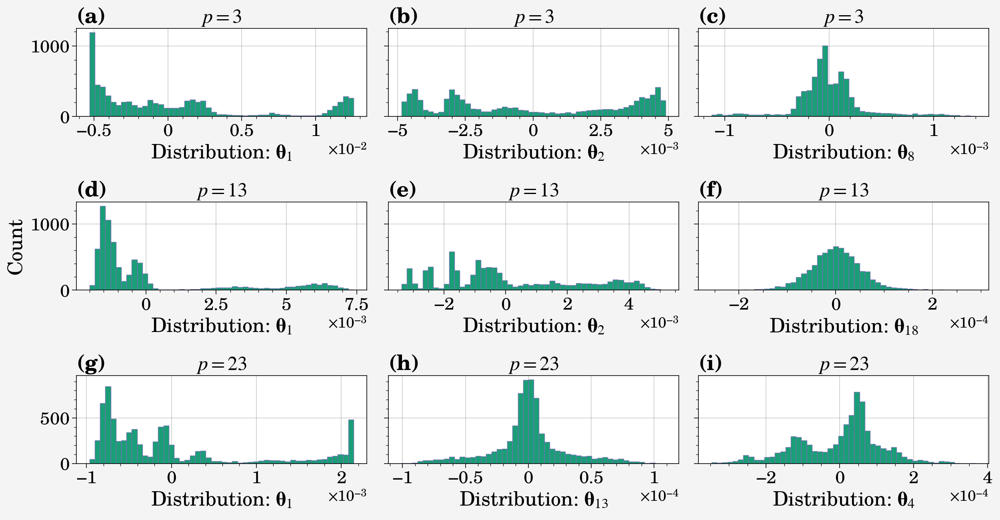

In [18]:
run = 17

pplt.rc['axes.labelsize'] = 16

fig, axs = pplt.subplots(ncols=3, nrows=3, figsize=(12.5, 6.5), sharex=False, sharey=True)

for p_i, p in enumerate([3, 13, 23]):

    file_res = np.load(f'GSA_results/parsim/PCE25/parsim_1024_input_20_runs_PCE_25_p_{p}.npz', 
                       allow_pickle=True)

    pce_total_Si = file_res['x1']
    pce_first_Si = file_res['x2']
    pce_gto_Si_diff_p = file_res['x3']
    pce_gfo_Si_diff_p = file_res['x4']       
    evals_diff_runs = file_res['x5'] 
    evecs_diff_runs = file_res['x6'] 
    coord_diff_runs = file_res['x7']
    g_diff_runs = file_res['x8']    
    residuals_diff_runs = file_res['x9'] 
    index_diff_runs = file_res['x10']    
    pce_errorr_diff_runs = file_res['x11']
    pce_mean_diff_runs = file_res['x12']
    pce_std_diff_runs = file_res['x13']


    for coord_i, coord_n in enumerate(coord_diff_runs[run]):
        axs[p_i*3+coord_i].hist(g_diff_runs[run][:, coord_i], bins=50, 
                          facecolor = '#1b9e77', edgecolor='#7570b3', linewidth=0.5)
        axs[p_i*3+coord_i].format(abc='(a)', 
                                  xlabel='Distribution: ' + r'$\mathbf{\theta}$'+r'$_{{{}}}$'.format(coord_n), 
                                  ylabel=r'Count', title=r'$p={{{}}}$'.format(p), titlesize=17)
        
    for ax in axs:
        ax.ticklabel_format(style="scientific", scilimits=(-2, -3), axis='x')
        ax.format(rc_kw={'title.size': 18,
                         'label.size': 18,
                         'tick.labelsize': 16,
                         'leftlabel.size': 17.5,
                         'abc.size': 19})
        
fig.tight_layout()
plt.savefig(f'plots/main_text/run{run}_coord_dist_diff_p.pdf', bbox_inches='tight')
plt.show()


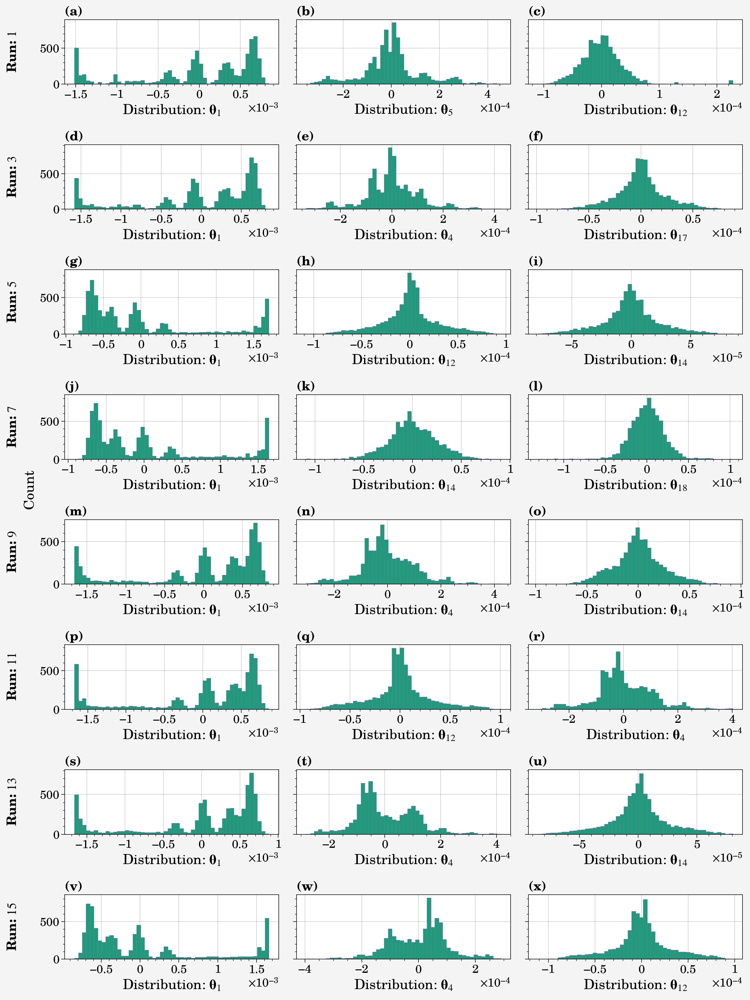

In [19]:
p=24

file_res = np.load(f'GSA_results/parsim/PCE25/parsim_1024_input_20_runs_PCE_25_p_{p}.npz', 
                       allow_pickle=True)

pce_total_Si = file_res['x1']
pce_first_Si = file_res['x2']
pce_gto_Si_diff_p = file_res['x3']
pce_gfo_Si_diff_p = file_res['x4']       
evals_diff_runs = file_res['x5'] # evals_diff_runs
evecs_diff_runs = file_res['x6'] # evecs_diff_runs
coord_diff_runs = file_res['x7'] # coord_diff_runs
g_diff_runs = file_res['x8']     # g_diff_runs
residuals_diff_runs = file_res['x9'] # residuals_diff_runs
index_diff_runs = file_res['x10']    # index_diff_runs
pce_errorr_diff_runs = file_res['x11']
pce_mean_diff_runs = file_res['x12']
pce_std_diff_runs = file_res['x13']


fig, axs = pplt.subplots(ncols=3, nrows=8, figsize=(12, 16), sharex=False, sharey=True)

for run_i, run in enumerate(np.arange(0,16,2)):
    
    for coord_i, coord_n in enumerate(coord_diff_runs[run]):
        axs[run_i*3+coord_i].hist(g_diff_runs[run][:, coord_i], bins=50, 
                          facecolor = '#1b9e77', edgecolor='#7570b3', linewidth=0.5)
        axs[run_i*3+coord_i].format(abc='(a)', 
                                    xlabel='Distribution: ' + 
                                    r'$\mathbf{\theta}$'+r'$_{{{}}}$'.format(coord_n), 
                                    ylabel=r'Count')
axs.format(leftlabels=[r'Run: ${{{}}}$'.format(run+1) for run in np.arange(0,16,2)])

for ax in axs:
    ax.ticklabel_format(style="scientific", scilimits=(-2, -3), axis='x')

fig.tight_layout()
plt.savefig(f'plots/SI/runs_coord_dist_p{p}.pdf', bbox_inches='tight')
plt.show()


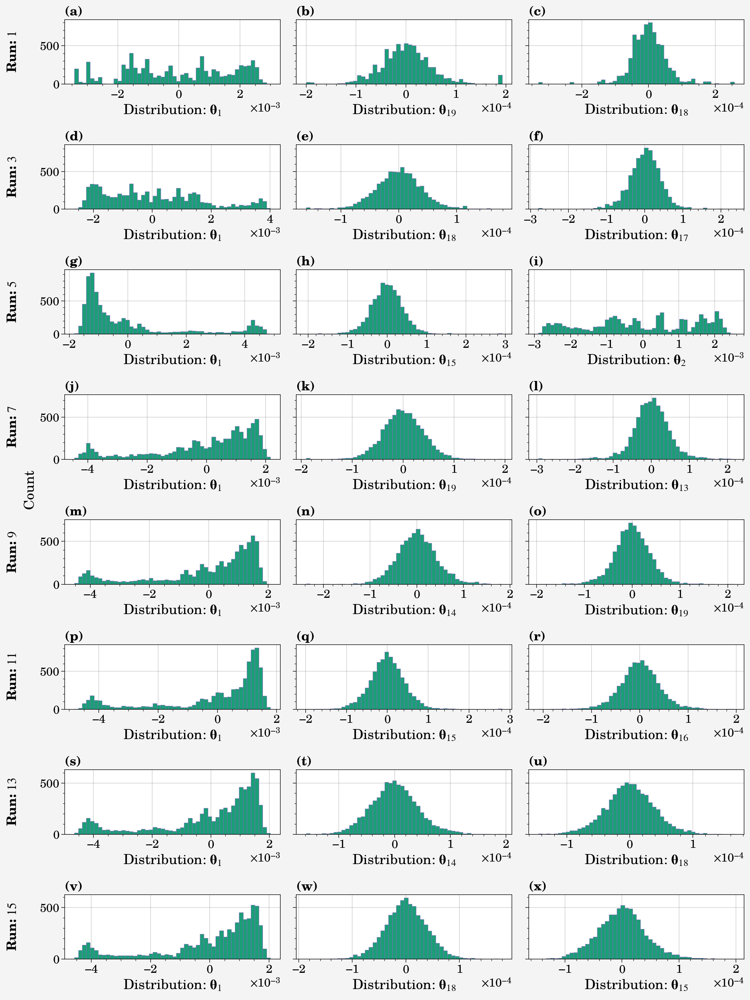

In [20]:
p=17

file_res = np.load(f'GSA_results/parsim/PCE25/parsim_1024_input_20_runs_PCE_25_p_{p}.npz', 
                       allow_pickle=True)

pce_total_Si = file_res['x1']
pce_first_Si = file_res['x2']
pce_gto_Si_diff_p = file_res['x3']
pce_gfo_Si_diff_p = file_res['x4']       
evals_diff_runs = file_res['x5'] 
evecs_diff_runs = file_res['x6']
coord_diff_runs = file_res['x7'] 
g_diff_runs = file_res['x8']     
residuals_diff_runs = file_res['x9'] 
index_diff_runs = file_res['x10']    
pce_errorr_diff_runs = file_res['x11']
pce_mean_diff_runs = file_res['x12']
pce_std_diff_runs = file_res['x13']


fig, axs = pplt.subplots(ncols=3, nrows=8, figsize=(12, 16), sharex=False, sharey=True)

for run_i, run in enumerate(np.arange(0,16,2)):
    
    for coord_i, coord_n in enumerate(coord_diff_runs[run]):
        axs[run_i*3+coord_i].hist(g_diff_runs[run][:, coord_i], bins=50, 
                          facecolor = '#1b9e77', edgecolor='#7570b3', linewidth=0.5)
        axs[run_i*3+coord_i].format(abc='(a)', 
                                    xlabel='Distribution: ' 
                                    + r'$\mathbf{\theta}$'+r'$_{{{}}}$'.format(coord_n), 
                                    ylabel=r'Count')
axs.format(leftlabels=[r'Run: ${{{}}}$'.format(run+1) for run in np.arange(0,16,2)])

for ax in axs:
    ax.ticklabel_format(style="scientific", scilimits=(-2, -3), axis='x')

fig.tight_layout()
plt.savefig(f'plots/SI/runs_coord_dist_p{p}.pdf', bbox_inches='tight')
plt.show()

In [21]:
p_array = [3, 13, 17, 22, 23, 24]

# parsimonious data
parsim_pce_total_Si_mean_p = {}
parsim_pce_first_Si_mean_p = {}
parsim_pce_total_Si_var_p = {}
parsim_pce_first_Si_var_p = {}

parsim_evals_p = {}
parsim_coords_p = {}
parsim_gs_p = {}

for p in p_array:
    file_res = np.load(f'GSA_results/parsim/PCE25/parsim_1024_input_20_runs_PCE_25_p_{p}.npz', 
                       allow_pickle=True)  
    pce_total_Si = file_res['x1']
    pce_first_Si = file_res['x2']
    pce_gto_Si_diff_p = file_res['x3']
    pce_gfo_Si_diff_p = file_res['x4']       
    evals_diff_runs = file_res['x5'] 
    evecs_diff_runs = file_res['x6'] 
    coord_diff_runs = file_res['x7'] 
    g_diff_runs = file_res['x8']     
    residuals_diff_runs = file_res['x9'] 
    index_diff_runs = file_res['x10']    
    pce_errorr_diff_runs = file_res['x11']
    pce_mean_diff_runs = file_res['x12']
    pce_std_diff_runs = file_res['x13']
    
    parsim_pce_total_Si_mean_p[p] = pce_total_Si.mean(axis=0)
    parsim_pce_first_Si_mean_p[p] = pce_first_Si.mean(axis=0)
    parsim_pce_total_Si_var_p[p] = pce_total_Si.var(axis=0, ddof=1)
    parsim_pce_first_Si_var_p[p] = pce_first_Si.var(axis=0, ddof=1)
    
    parsim_evals_p[p] = evals_diff_runs
    parsim_coords_p[p] = coord_diff_runs
    parsim_gs_p[p] = g_diff_runs
    
    
    
# non-parsimonious data    
np_pce_total_Si_mean_p = {}
np_pce_first_Si_mean_p = {}
np_pce_total_Si_var_p = {}
np_pce_first_Si_var_p = {}

np_coords_p = {}
np_gs_p = {}

for p in p_array:
    file_res = np.load(f'GSA_results/nonparsim/PCE25/nonparsim_1024_input_20_runs_PCE_25_p_{p}.npz', 
                       allow_pickle=True)
    
    pce_total_Si = file_res['x1']
    pce_first_Si = file_res['x2']     

    coord_diff_runs = file_res['x7'] 
    g_diff_runs = file_res['x8']     
    
    np_pce_total_Si_mean_p[p] = pce_total_Si.mean(axis=0)
    np_pce_first_Si_mean_p[p] = pce_first_Si.mean(axis=0)
    np_pce_total_Si_var_p[p] = pce_total_Si.var(axis=0, ddof=1)
    np_pce_first_Si_var_p[p] = pce_first_Si.var(axis=0, ddof=1)
    
    np_coords_p[p] = coord_diff_runs
    np_gs_p[p] = g_diff_runs
    


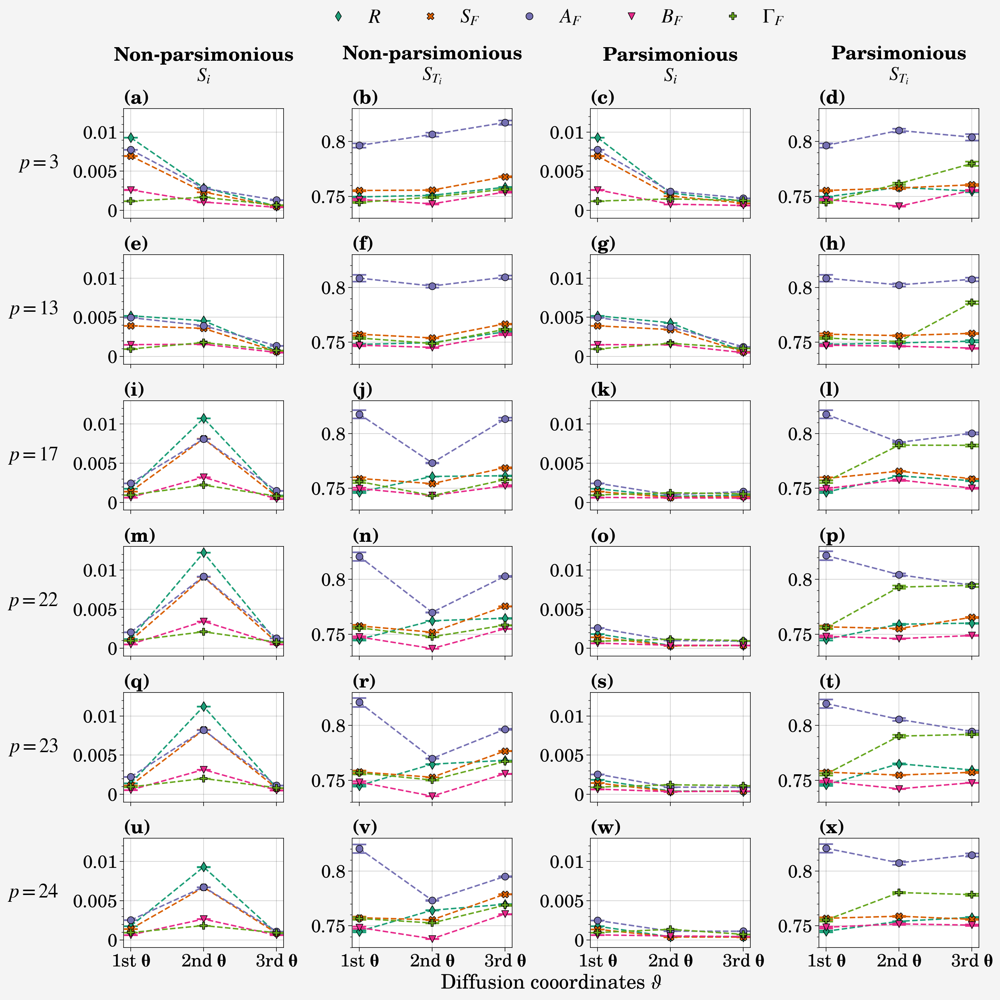

In [22]:
pplt.rc['axes.labelsize'] = 17

fig, axs = pplt.subplots(ncols=4, nrows=6, figsize=(14, 14), sharex=True, sharey=False)

col1 = np.linspace(0, 20, 6, dtype='int')
col2 = np.linspace(1, 21, 6, dtype='int')
col3 = np.linspace(2, 22, 6, dtype='int')
col4 = np.linspace(3, 23, 6, dtype='int')

error_marker_styles = ['d', 'X','o', 'v', 'P', 's', '*']
colors=mcp.gen_color(cmap="Dark2",n=9)


for p_ind, p in enumerate(p_array):
    for i, param in enumerate(param_names_short.values()):
        
        
        axs[col1[p_ind]].scatter(np.linspace(1, 3, 3, dtype='int'), 
                                 np_pce_first_Si_mean_p[p][i], color=colors[i],
                                 label=param, edgecolor='k', 
                                 marker=error_marker_styles[i], 
                                 markersize=50, zorder=3)   
        axs[col1[p_ind]].errorbar(np.linspace(1, 3, 3, dtype='int'), 
                                  np_pce_first_Si_mean_p[p][i], 
                                  np_pce_first_Si_var_p[p][i], 
                                  color=colors[i],
                                  markeredgewidth=1.7, 
                                  linestyle='--', capsize=7, alpha=1, elinewidth=1.2) 
        axs[col1[p_ind]].format(ylim=(-0.001, 0.013))
        
        axs[col2[p_ind]].scatter(np.linspace(1, 3, 3, dtype='int'), 
                                 np_pce_total_Si_mean_p[p][i], color=colors[i],
                                 label=param, edgecolor='k', 
                                 marker=error_marker_styles[i], 
                                 markersize=50, zorder=3)   
        axs[col2[p_ind]].errorbar(np.linspace(1, 3, 3, dtype='int'), 
                                  np_pce_total_Si_mean_p[p][i], 
                                  np_pce_total_Si_var_p[p][i], 
                                  color=colors[i],
                                  markeredgewidth=1.7, 
                                  linestyle='--', capsize=7, alpha=1, elinewidth=1.2) 
        axs[col2[p_ind]].format(ylim=(0.73, 0.83))
        
        axs[col3[p_ind]].scatter(np.linspace(1, 3, 3, dtype='int'), 
                                 parsim_pce_first_Si_mean_p[p][i], color=colors[i],
                                 label=param, edgecolor='k', 
                                 marker=error_marker_styles[i], 
                                 markersize=50, zorder=3)   
        axs[col3[p_ind]].errorbar(np.linspace(1, 3, 3, dtype='int'), 
                                  parsim_pce_first_Si_mean_p[p][i], 
                                  parsim_pce_first_Si_var_p[p][i],  
                                  color=colors[i],
                                  markeredgewidth=1.7, 
                                  linestyle='--', capsize=7, alpha=1, elinewidth=1.2) 
        axs[col3[p_ind]].format(ylim=(-0.001, 0.013))
                                
        axs[col4[p_ind]].scatter(np.linspace(1, 3, 3, dtype='int'), 
                                 parsim_pce_total_Si_mean_p[p][i], color=colors[i],
                                 label=param, edgecolor='k', 
                                 marker=error_marker_styles[i], 
                                 markersize=50, zorder=3)   
        axs[col4[p_ind]].errorbar(np.linspace(1, 3, 3, dtype='int'), 
                                  parsim_pce_total_Si_mean_p[p][i], 
                                  parsim_pce_total_Si_var_p[p][i],  
                                  color=colors[i],
                                  markeredgewidth=1.7,
                                  linestyle='--', capsize=7, alpha=1, elinewidth=1.2) 
        axs[col4[p_ind]].format(ylim=(0.73, 0.83))
         
    for ax in axs:
        ax.format(abc='(a)', xlabel=r'Diffusion cooordinates $\vartheta$', 
                  xticklabels=['0', '1st '+r"$\mathbf{\theta}$", 
                               '2nd '+r"$\mathbf{\theta}$",  
                               '3rd '+r"$\mathbf{\theta}$"])
        ax.format(rc_kw={'title.size': 19,
                         'label.size': 20,
                         'tick.labelsize': 18,
                         'abc.size': 19,
                         'toplabel.size': 19,
                         'leftlabel.size': 20,
                         'leftlabel.pad': 15,
                         'leftlabel.rotation': "horizontal",})
        
axs.format(toplabels=('Non-parsimonious\n' + r'$S_i$', 
                      'Non-parsimonious\n' + r'$S_{T_i}$',
                      'Parsimonious\n' + r'$S_i$', 
                      'Parsimonious\n'+ r'$S_{T_i}$'),
          leftlabels=[r"$p=3$", r"$p=13$", r"$p=17$", r"$p=22$", r"$p=23$", r"$p=24$"])
            
fig.legend(param_names_short.values(), ncols=5, frame=False, loc='t',
           fontsize = 20, bbox_to_anchor=(0.5, 3.5))

fig.tight_layout()
plt.savefig('plots/main_text/GDMaps_PCE_GSA_parsim_np.pdf', bbox_inches='tight')
plt.show()       

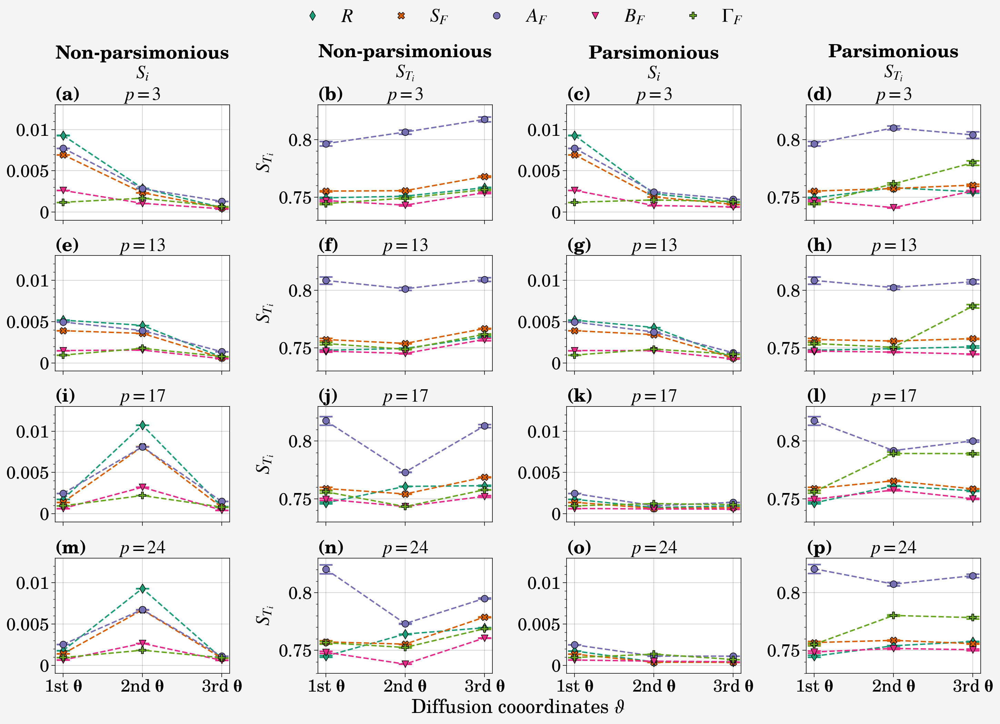

In [23]:
p_array_ = [3, 13, 17, 24]

pplt.rc['axes.labelsize'] = 17

fig, axs = pplt.subplots(ncols=4, nrows=4, figsize=(14.5, 10.5), sharex=True, sharey=False)

col1 = np.linspace(0, 12, 4, dtype='int')
col2 = np.linspace(1, 13, 4, dtype='int')
col3 = np.linspace(2, 14, 4, dtype='int')
col4 = np.linspace(3, 15, 4, dtype='int')

error_marker_styles = ['d', 'X','o', 'v', 'P', 's', '*']
colors=mcp.gen_color(cmap="Dark2",n=9)


for p_ind, p in enumerate(p_array_):
    for i, param in enumerate(param_names_short.values()):
        
        
        axs[col1[p_ind]].scatter(np.linspace(1, 3, 3, dtype='int'), 
                                 np_pce_first_Si_mean_p[p][i], color=colors[i],
                                 label=param, edgecolor='k', 
                                 marker=error_marker_styles[i], 
                                 markersize=50, zorder=3)   
        axs[col1[p_ind]].errorbar(np.linspace(1, 3, 3, dtype='int'), 
                                  np_pce_first_Si_mean_p[p][i], 
                                  np_pce_first_Si_var_p[p][i], 
                                  color=colors[i],
                                  markeredgewidth=1.7, 
                                  linestyle='--', capsize=7, alpha=1, elinewidth=1.2) 
        axs[col1[p_ind]].format(ylim=(-0.001, 0.013))
        axs[col1[p_ind]].format(title=r'$p={}$'.format(p))
        
        axs[col2[p_ind]].scatter(np.linspace(1, 3, 3, dtype='int'), 
                                 np_pce_total_Si_mean_p[p][i], color=colors[i],
                                 label=param, edgecolor='k', 
                                 marker=error_marker_styles[i], 
                                 markersize=50, zorder=3)   
        axs[col2[p_ind]].errorbar(np.linspace(1, 3, 3, dtype='int'), 
                                  np_pce_total_Si_mean_p[p][i], 
                                  np_pce_total_Si_var_p[p][i], 
                                  color=colors[i],
                                  markeredgewidth=1.7, 
                                  linestyle='--', capsize=7, alpha=1, elinewidth=1.2) 
        axs[col2[p_ind]].format(ylabel=r'$S_{T_i}$', ylim=(0.73, 0.83))
        axs[col2[p_ind]].format(title=r'$p={}$'.format(p))
        
        axs[col3[p_ind]].scatter(np.linspace(1, 3, 3, dtype='int'), 
                                 parsim_pce_first_Si_mean_p[p][i], color=colors[i],
                                 label=param, edgecolor='k', 
                                 marker=error_marker_styles[i], 
                                 markersize=50, zorder=3)   
        axs[col3[p_ind]].errorbar(np.linspace(1, 3, 3, dtype='int'), 
                                  parsim_pce_first_Si_mean_p[p][i], 
                                  parsim_pce_first_Si_var_p[p][i],  
                                  color=colors[i],
                                  markeredgewidth=1.7, 
                                  linestyle='--', capsize=7, alpha=1, elinewidth=1.2) 
        axs[col3[p_ind]].format(ylim=(-0.001, 0.013))
        axs[col3[p_ind]].format(title=r'$p={}$'.format(p))
                                
        axs[col4[p_ind]].scatter(np.linspace(1, 3, 3, dtype='int'), 
                                 parsim_pce_total_Si_mean_p[p][i], color=colors[i],
                                 label=param, edgecolor='k', 
                                 marker=error_marker_styles[i], 
                                 markersize=50, zorder=3)   
        axs[col4[p_ind]].errorbar(np.linspace(1, 3, 3, dtype='int'), 
                                  parsim_pce_total_Si_mean_p[p][i], 
                                  parsim_pce_total_Si_var_p[p][i],  
                                  color=colors[i],
                                  markeredgewidth=1.7,
                                  linestyle='--', capsize=7, alpha=1, elinewidth=1.2) 
        axs[col4[p_ind]].format(ylim=(0.73, 0.83))
        axs[col4[p_ind]].format(title=r'$p={}$'.format(p))
         
    for ax in axs:
        ax.format(abc='(a)', xlabel=r'Diffusion cooordinates $\vartheta$', 
                  xticklabels=['0', '1st '+r"$\mathbf{\theta}$", 
                               '2nd '+r"$\mathbf{\theta}$",  
                               '3rd '+r"$\mathbf{\theta}$"])
        ax.format(rc_kw={'title.size': 19,
                         'label.size': 20,
                         'tick.labelsize': 18,
                         'abc.size': 19,
                         'toplabel.size': 19})
        
axs.format(toplabels=('Non-parsimonious\n' + r'$S_i$', 
                      'Non-parsimonious\n' + r'$S_{T_i}$',
                      'Parsimonious\n' + r'$S_i$', 
                      'Parsimonious\n'+ r'$S_{T_i}$'))
            
fig.legend(param_names_short.values(), ncols=5, frame=False, loc='t',
           fontsize = 20, bbox_to_anchor=(0.5, 3.5))

fig.tight_layout()
plt.savefig('plots/SI/GDMaps_PCE_GSA_parsim_np_4Grassdim.pdf', bbox_inches='tight')
plt.show()       

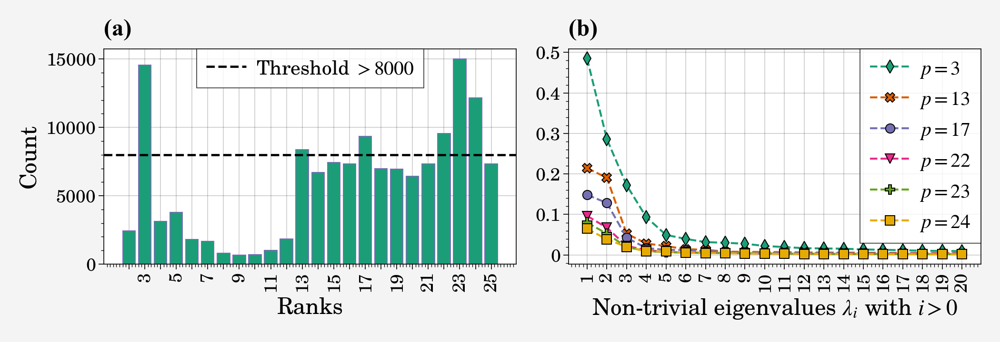

In [24]:
marker_styles = ['d--', 'X--', 'o--',  'v--', 'P--', 's--','*--']
colors=mcp.gen_color(cmap="Dark2",n=9)

run = 3

fig, axs = plt.subplots(ncols=2, nrows=1, figsize=(10.5, 3.6))
                        
for i, p in enumerate(p_array):
    axs[1].plot(np.arange(1, len(parsim_evals_p[p][run]), 1), 
                parsim_evals_p[p][run][1:], marker_styles[i], 
                label=r'$p={}$'.format(p), color=colors[i],
                markeredgecolor='k', markeredgewidth=0.7,
                markersize=7)
    axs[1].set_xlabel(r'Non-trivial eigenvalues $\lambda_i$ with $i > 0$')
    axs[1].legend(fontsize=15)
    xticks = np.arange(1, len(parsim_evals_p[p][run]), 1)
    axs[1].set_xticks(xticks,
                      ['{}'.format(num) for num in xticks], 
                      rotation=90)
axs[1].set_title('(b)', fontname="Times New Roman", size=18,
                 fontweight="bold", loc='left', pad=10)
    
axs[0].bar(unique, counts, facecolor = '#1b9e77', edgecolor='#7570b3', linewidth=0.7)
xticks_label = ['{}'.format(num) if num % 2 != 0 else ' ' for num in unique]
axs[0].set_xticks(unique, xticks_label, rotation=90)
axs[0].axhline(y=8000, xmin=0, xmax=26, c='k', 
               linewidth=1.7, ls='--', zorder=1, label=r'Threshold $>8000$')
axs[0].legend(fontsize=15)
axs[0].set(ylabel = r'Count', xlabel = r'Ranks')
axs[0].set_title('(a)', fontname="Times New Roman", size=18,
                 fontweight="bold", loc='left', pad=10)

plt.tight_layout()
plt.savefig('plots/main_text/ranks_hist_egenvals_diff_p.pdf', bbox_inches='tight')
plt.show()


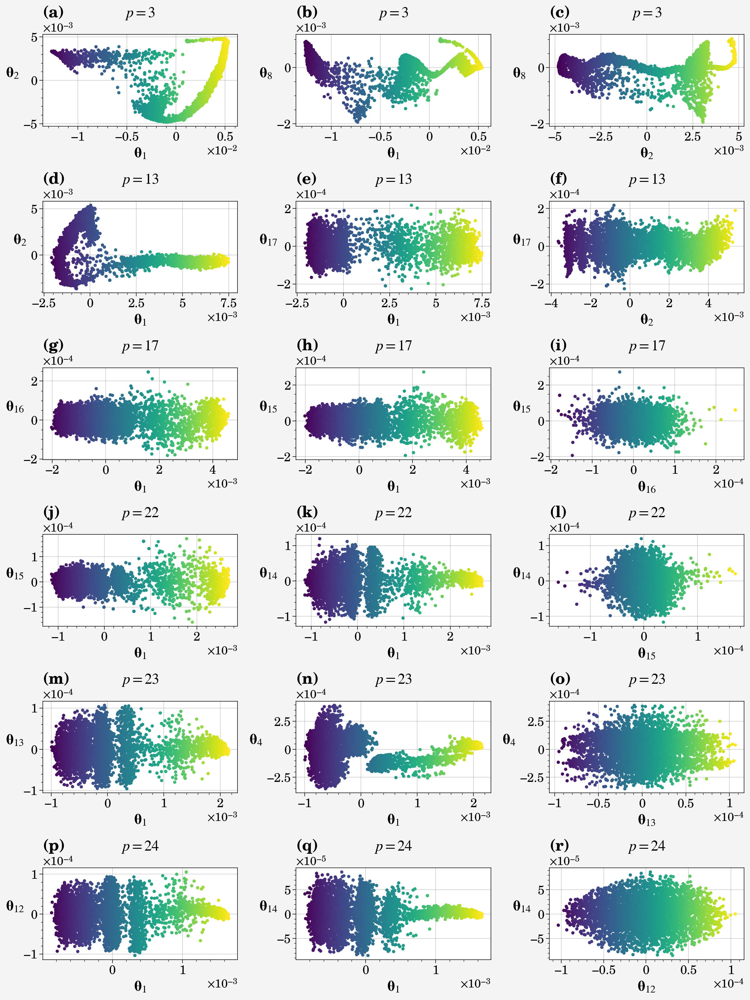

In [25]:
run = 16

pplt.rc['title.pad']= 15.0 # default 5.0


fig, axs = pplt.subplots(ncols=3, nrows=6, figsize=(12, 16), sharex=False, sharey=False)

for row, p in enumerate(p_array):
    
    axs[row*3].scatter(parsim_gs_p[p][run][:, 0], parsim_gs_p[p][run][:, 1], 
                       c=parsim_gs_p[p][run][:, 0], cmap='viridis', 
                       s=10)
#                        edgecolors='k', linewidth=0.1)
    axs[row*3].format(xlabel=r"$\mathbf{\theta}$"+r"$_{{{}}}$".format(parsim_coords_p[p][run][0]),
                      title=r'$p={}$'.format(p))
    axs[row*3].set_ylabel(r"$\mathbf{\theta}$"+r"$_{{{}}}$".format(parsim_coords_p[p][run][1]),
                           labelpad=20)
    
    axs[row*3+1].scatter(parsim_gs_p[p][run][:, 0], parsim_gs_p[p][run][:, 2], 
                         c=parsim_gs_p[p][run][:, 0], cmap='viridis', 
                         s=10)
#     edgecolors='k', linewidth=0.1)
    axs[row*3+1].format(xlabel=r"$\mathbf{\theta}$"+r"$_{{{}}}$".format(parsim_coords_p[p][run][0]),
                       title=r'$p={}$'.format(p))
    axs[row*3+1].set_ylabel(r"$\mathbf{\theta}$"+r"$_{{{}}}$".format(parsim_coords_p[p][run][2]),
                           labelpad=20)

    
    axs[row*3+2].scatter(parsim_gs_p[p][run][:, 1], parsim_gs_p[p][run][:, 2], 
                         c=parsim_gs_p[p][run][:, 1], cmap='viridis', 
                         s=10)
#     edgecolors='k', linewidth=0.1)
    axs[row*3+2].format(xlabel=r"$\mathbf{\theta}$"+r"$_{{{}}}$".format(parsim_coords_p[p][run][1]),
                       title=r'$p={}$'.format(p))
    axs[row*3+2].set_ylabel(r"$\mathbf{\theta}$"+r"$_{{{}}}$".format(parsim_coords_p[p][run][2]),
                           labelpad=20)
    
    for ax in axs:
        ax.ticklabel_format(style="scientific", scilimits=(-2, -3))
        ax.format(abc='(a)',
                  rc_kw={'title.size': 17,
                         'label.size': 17,
                         'tick.labelsize': 14,
                         'abc.size': 18,
                         'title.pad': 20})
for i, ax in enumerate(axs):
    ax.yaxis.label.set(rotation='horizontal', ha='left')
    
fig.tight_layout()
plt.savefig('plots/SI/parsim_dcoords_run16.pdf', dpi=300, bbox_inches='tight')
plt.show()



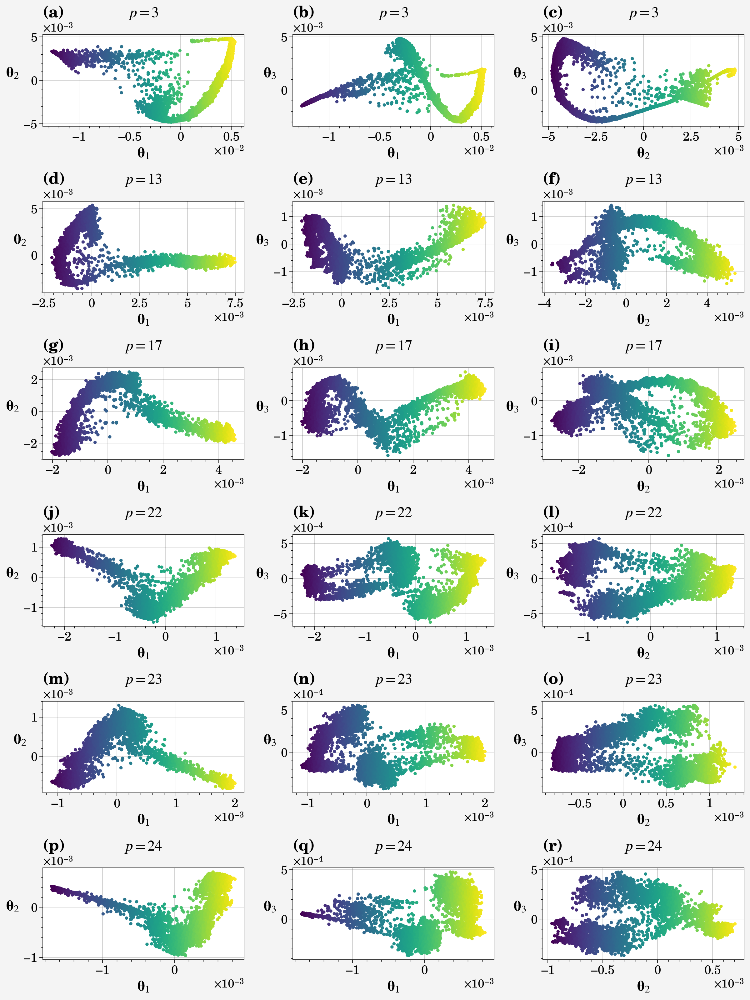

In [26]:
run = 16

pplt.rc['title.pad']= 15.0 # default 5.0

fig, axs = pplt.subplots(ncols=3, nrows=6, figsize=(12, 16), sharex=False, sharey=False)

for row, p in enumerate(p_array):
    
    axs[row*3].scatter(np_gs_p[p][run][:, 0], np_gs_p[p][run][:, 1], 
                       c=np_gs_p[p][run][:, 0], cmap='viridis', 
                       s=10)
#     edgecolors='k', linewidth=0.1)
    
    axs[row*3].format(xlabel=r"$\mathbf{\theta}$"+r"$_{{{}}}$".format(np_coords_p[p][run][0]),
                      title=r'$p={}$'.format(p))
    axs[row*3].set_ylabel(r"$\mathbf{\theta}$"+r"$_{{{}}}$".format(np_coords_p[p][run][1]),
                           labelpad=20)
    
    axs[row*3+1].scatter(np_gs_p[p][run][:, 0], np_gs_p[p][run][:, 2], 
                         c=np_gs_p[p][run][:, 0], cmap='viridis', 
                         s=10)
#     edgecolors='k', linewidth=0.1)
    axs[row*3+1].format(xlabel=r"$\mathbf{\theta}$"+r"$_{{{}}}$".format(np_coords_p[p][run][0]),
                       title=r'$p={}$'.format(p))
    axs[row*3+1].set_ylabel(r"$\mathbf{\theta}$"+r"$_{{{}}}$".format(np_coords_p[p][run][2]),
                           labelpad=20)
    
    axs[row*3+2].scatter(np_gs_p[p][run][:, 1], np_gs_p[p][run][:, 2], 
                         c=np_gs_p[p][run][:, 1], cmap='viridis', 
                         s=10)
#     edgecolors='k', linewidth=0.1)
    axs[row*3+2].format(xlabel=r"$\mathbf{\theta}$"+r"$_{{{}}}$".format(np_coords_p[p][run][1]),
                       title=r'$p={}$'.format(p))
    axs[row*3+2].set_ylabel(r"$\mathbf{\theta}$"+r"$_{{{}}}$".format(np_coords_p[p][run][2]),
                           labelpad=20)
    
    for ax in axs:
        ax.ticklabel_format(style="scientific", scilimits=(-2, -3))
        ax.format(abc='(a)',
                  rc_kw={'title.size': 17,
                         'label.size': 17,
                         'tick.labelsize': 14,
                         'abc.size': 18,
                         'title.pad': 20})
for i, ax in enumerate(axs):
    ax.yaxis.label.set(rotation='horizontal', ha='left')
    
    
fig.tight_layout()
plt.savefig('plots/SI/nonparsim_dcoords_run16.pdf', dpi=300, bbox_inches='tight')
plt.show()

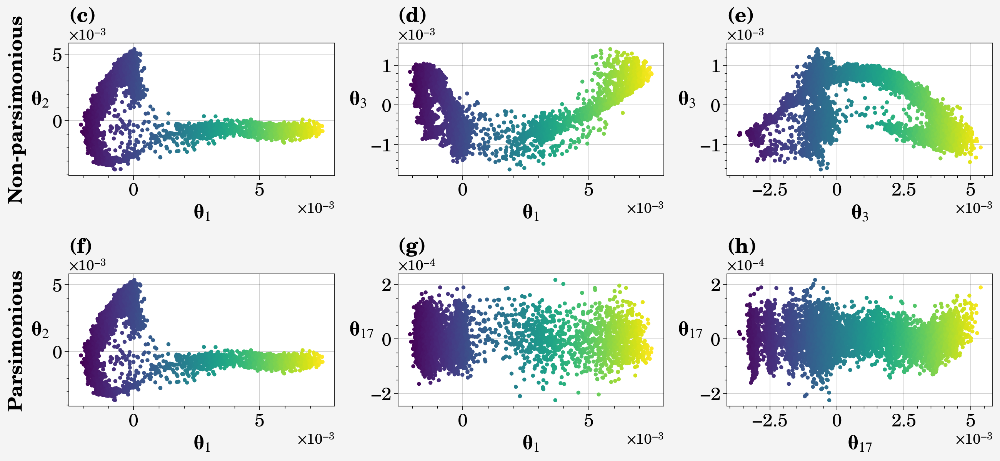

In [27]:
pplt.rc['title.pad']= 5.0 # default 5.0
pplt.rc['axes.labelsize'] = 16

numbering = ['(c)', '(d)', '(e)', '(f)', '(g)', '(h)']

run = 16
p = 13
fig, axs = pplt.subplots(ncols=3, nrows=2, figsize=(13, 6), sharex=False, sharey=False)

coord_data = [np_coords_p, parsim_coords_p]

for row, g_data in enumerate([np_gs_p, parsim_gs_p]):
    axs[row*3].scatter(g_data[p][run][:, 0], g_data[p][run][:, 1], 
                       c=g_data[p][run][:, 0], cmap='viridis', 
                       s=10)
#     edgecolors='k', linewidth=0.1)
    axs[row*3].format(xlabel=r"$\mathbf{\theta}$"+r"$_{{{}}}$".format(coord_data[row][p][run][0]))
    axs[row*3].set_ylabel(r"$\mathbf{\theta}$"+r"$_{{{}}}$".format(coord_data[row][p][run][1]),
                           labelpad=20)
    
    axs[row*3+1].scatter(g_data[p][run][:, 0], g_data[p][run][:, 2], 
                         c=g_data[p][run][:, 0], cmap='viridis', 
                         s=10)
#                          edgecolors='k', linewidth=0.1)                   
    axs[row*3+1].format(xlabel=r"$\mathbf{\theta}$"+r"$_{{{}}}$".format(coord_data[row][p][run][0]))
    axs[row*3+1].set_ylabel(r"$\mathbf{\theta}$"+r"$_{{{}}}$".format(coord_data[row][p][run][2]),
                           labelpad=20)

    axs[row*3+2].scatter(g_data[p][run][:, 1], g_data[p][run][:, 2], 
                         c=parsim_gs_p[p][run][:, 1], cmap='viridis', 
                         s=10)
#     edgecolors='k', linewidth=0.1)                   
    axs[row*3+2].format(xlabel=r"$\mathbf{\theta}$"+r"$_{{{}}}$".format(coord_data[row][p][run][2]))
    axs[row*3+2].set_ylabel(r"$\mathbf{\theta}$"+r"$_{{{}}}$".format(coord_data[row][p][run][2]),
                           labelpad=20)
    
for i, ax in enumerate(axs):
    ax.format(title=numbering[i], titleloc='left', 
              titlepad=20, titleweight='bold')
    ax.ticklabel_format(style="scientific", scilimits=(-2, -3))
    ax.format(rc_kw={'title.size': 19,
                     'label.size': 19,
                     'tick.labelsize': 17,
                     'leftlabel.size': 18.5})
    ax.yaxis.label.set(rotation='horizontal', ha='left')

axs.format(leftlabels=['Non-parsimonious', 'Parsimonious'])

fig.tight_layout()
plt.savefig('plots/main_text/GDMaps_parsim_nonparsim_coords_16.pdf', dpi=300, bbox_inches='tight')
plt.show()       


In [28]:
p_array = [3, 13, 17, 22, 23, 24]
max_degree = [10, 15, 20, 25]

pce_total_Si_mean_p_d = {}
pce_first_Si_mean_p_d = {}
pce_total_Si_var_p_d = {}
pce_first_Si_var_p_d = {}

pce_errorr_mean_d  = np.zeros((len(max_degree), len(p_array), 3))
pce_errorr_std_d = np.zeros((len(max_degree), len(p_array), 3))
pce_errorr_var_d = np.zeros((len(max_degree), len(p_array), 3))

for d_ind, d in enumerate(max_degree):
    pce_total_Si_mean_p = {}
    pce_first_Si_mean_p = {}
    pce_total_Si_var_p = {}
    pce_first_Si_var_p = {}
    
    pce_errorr_mean_p = {}
    pce_errorr_std_p = {}
    pce_errorr_var_p = {}
    
    for p_ind, p in enumerate(p_array):
        file_res = np.load(f'GSA_results/parsim/PCE{d}/parsim_1024_input_20_runs_PCE_{d}_p_{p}.npz', 
                           allow_pickle=True)
        pce_total_Si = file_res['x1']
        pce_first_Si = file_res['x2']
        
        pce_errorr_diff_runs = file_res['x11']

        pce_total_Si_mean_p[p] = pce_total_Si.mean(axis=0)
        pce_first_Si_mean_p[p] = pce_first_Si.mean(axis=0)
        pce_total_Si_var_p[p]  = pce_total_Si.var(axis=0, ddof=1)
        pce_first_Si_var_p[p]  = pce_first_Si.var(axis=0, ddof=1)
        
        pce_errorr_mean_d[d_ind, p_ind] = pce_errorr_diff_runs.mean(axis=0)
        pce_errorr_std_d[d_ind, p_ind]  = pce_errorr_diff_runs.std(axis=0, ddof=1)
        pce_errorr_var_d[d_ind, p_ind]  = pce_errorr_diff_runs.var(axis=0, ddof=1)

    pce_total_Si_mean_p_d[d] = pce_total_Si_mean_p
    pce_first_Si_mean_p_d[d] = pce_first_Si_mean_p
    pce_total_Si_var_p_d[d] = pce_total_Si_var_p
    pce_first_Si_var_p_d[d] = pce_first_Si_var_p


In [29]:
ordinal = lambda n: "%d%s" % (n,"tsnrhtdd"[(n//10%10!=1)*(n%10<4)*n%10::4])

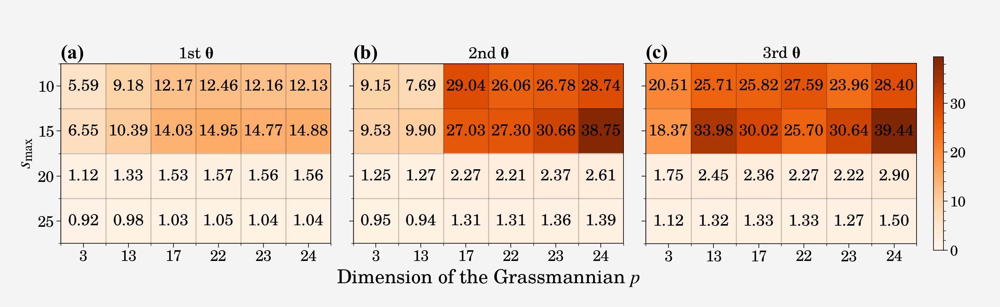

In [30]:
fig, axs = plt.subplots(ncols=3, nrows=1, figsize=(13, 4), sharex=True, sharey=True,
                        gridspec_kw={'width_ratios': [3, 3, 3.76]})

numbering= ['(a)', '(b)', '(c)']
for i in range(3):
    im = axs[i].imshow(pce_errorr_mean_d[:, :, i], vmin=0, vmax=39.44, cmap='Oranges')
    
    axs[i].set_xticks(np.arange(len(p_array)), labels=p_array, size=14)
    axs[i].set_yticks(np.arange(len(max_degree)), labels=max_degree, size=14)

    for row in range(len(max_degree)):
        for col in range(len(p_array)):
            text = axs[i].text(col, row, '%.2f' % pce_errorr_mean_d[:, :, i][row, col],
                               fontsize=15, color='black',
                 horizontalalignment='center',
                 verticalalignment='center')
            
    axs[i].set_xticks(np.arange(-.5, 6, 1), minor=True)
    axs[i].set_yticks(np.arange(-.5, 4, 1), minor=True)

    # Gridlines based on minor ticks
    axs[i].grid(which='minor', color='k', linestyle='-', linewidth=1)
    axs[i].grid(False)
    axs[i].set(title=ordinal(i+1)+r" $\mathbf{\theta}$"+"".format(i+1))
    axs[i].set_title(numbering[i], fontname="Times New Roman", size=19,
                 fontweight="bold", loc='left')
    
    if i==1:
        axs[i].set_xlabel(r'Dimension of the Grassmannian $p$', fontsize=18)
    if i==0:
        axs[i].set_ylabel(r'$s_\max$', fontsize=18)
        
fig.colorbar(im, location='right', shrink=0.70)
plt.tight_layout()
plt.savefig('plots/main_text/GDMaps_PCE_errors_mean.pdf', bbox_inches='tight')
plt.show()



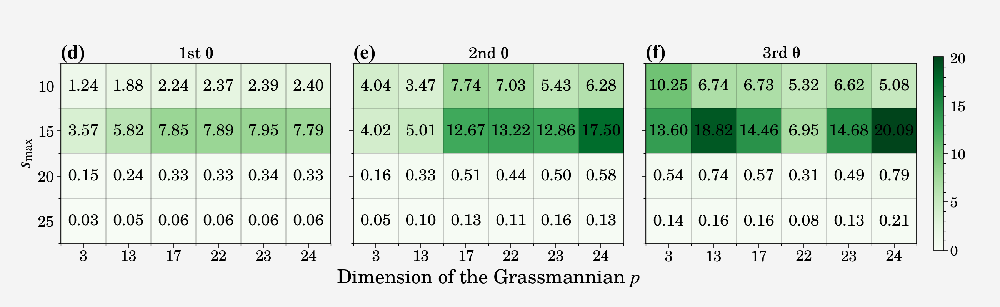

In [31]:
fig, axs = plt.subplots(ncols=3, nrows=1, figsize=(13, 4), sharex=True, sharey=True,
                        gridspec_kw={'width_ratios': [3, 3, 3.76]})

numbering= ['(d)', '(e)', '(f)']
for i in range(3):
    im = axs[i].imshow(pce_errorr_std_d[:, :, i], vmin=0, vmax=20.09, cmap='Greens')
    
    axs[i].set_xticks(np.arange(len(p_array)), labels=p_array, size=14)
    axs[i].set_yticks(np.arange(len(max_degree)), labels=max_degree, size=14)

    for row in range(len(max_degree)):
        for col in range(len(p_array)):
            text = axs[i].text(col, row, '%.2f' % pce_errorr_std_d[:, :, i][row, col],
                               fontsize=15, color='black',
                 horizontalalignment='center',
                 verticalalignment='center')
            
    axs[i].set_xticks(np.arange(-.5, 6, 1), minor=True)
    axs[i].set_yticks(np.arange(-.5, 4, 1), minor=True)

    # Gridlines based on minor ticks
    axs[i].grid(which='minor', color='k', linestyle='-', linewidth=1)
    axs[i].grid(False)
    axs[i].set(title=ordinal(i+1)+r" $\mathbf{\theta}$"+"".format(i+1))
    axs[i].set_title(numbering[i], fontname="Times New Roman", size=19,
                 fontweight="bold", loc='left')
    
    if i==1:
        axs[i].set_xlabel(r'Dimension of the Grassmannian $p$', fontsize=18)
    if i==0:
        axs[i].set_ylabel(r'$s_\max$', fontsize=18)
        
fig.colorbar(im, location='right', shrink=0.70)
fig.tight_layout()
plt.savefig('plots/main_text/GDMaps_PCE_errors_std.pdf', bbox_inches='tight')
plt.show()

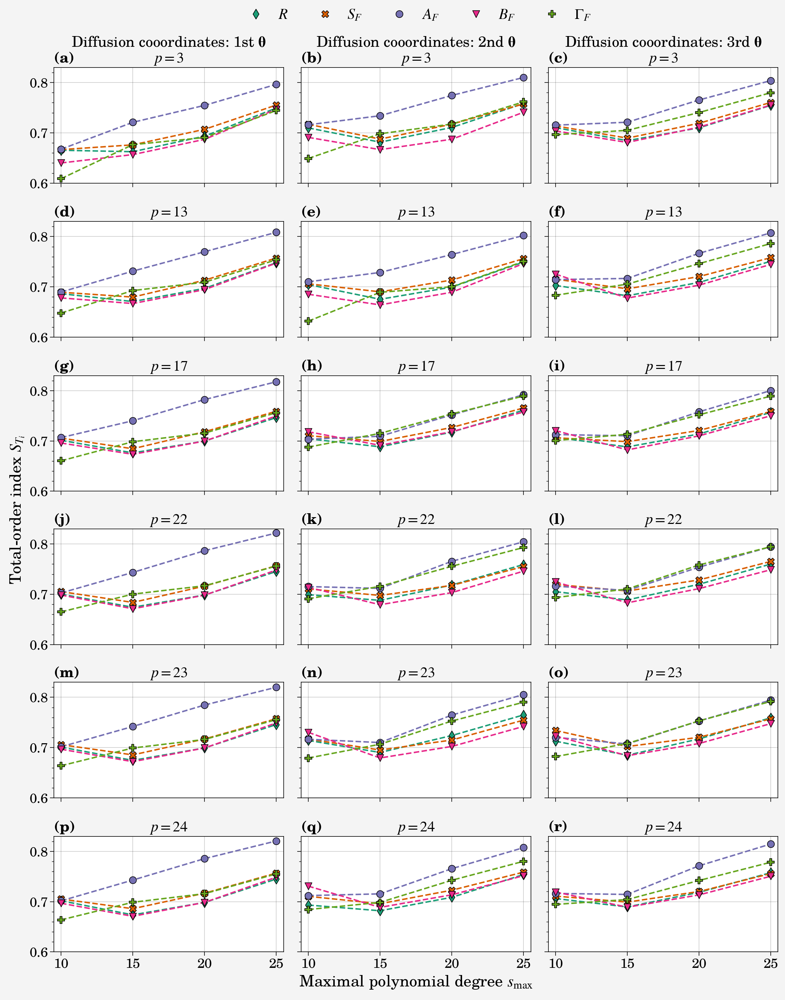

In [32]:
fig, axs = pplt.subplots(ncols=3, nrows=6, figsize=(11, 14), sharex=True)

col1 = np.linspace(0, 15, 6, dtype='int')
col2 = np.linspace(1, 16, 6, dtype='int')
col3 = np.linspace(2, 17, 6, dtype='int')

# param_styles = ['d--', 'X--', 'o--',  'v--', 'P--', 's--','*--']
marker_styles = ['d', 'X','o', 'v', 'P', 's', '*']
colors=mcp.gen_color(cmap="Dark2",n=9)

for row, p in enumerate(p_array):
    for i, param in enumerate(problem['names']):
        vars_at_d1 = []
        vars_at_d2 = []
        vars_at_d3 = []
        for d in max_degree:
            vars_at_d1.append(pce_total_Si_mean_p_d[d][p][:, 0][i])
            vars_at_d2.append(pce_total_Si_mean_p_d[d][p][:, 1][i])
            vars_at_d3.append(pce_total_Si_mean_p_d[d][p][:, 2][i])
            
        axs[col1[row]].scatter(np.linspace(1, 4, 4, dtype='int'), vars_at_d1, 
                               marker=marker_styles[i], label=param_names_short[param], 
                               color=colors[i], edgecolor='k', markersize=50, zorder=3)
        axs[col1[row]].plot(np.linspace(1, 4, 4, dtype='int'), vars_at_d1, 
                            color=colors[i], ls='--')
        axs[col2[row]].scatter(np.linspace(1, 4, 4, dtype='int'), vars_at_d2,
                               marker=marker_styles[i], label=param_names_short[param], 
                               color=colors[i], edgecolor='k', markersize=50, zorder=3)
        axs[col2[row]].plot(np.linspace(1, 4, 4, dtype='int'), vars_at_d2, 
                            color=colors[i], ls='--')
        axs[col3[row]].scatter(np.linspace(1, 4, 4, dtype='int'), vars_at_d3,
                            marker=marker_styles[i], label=param_names_short[param], 
                            color=colors[i], edgecolor='k', markersize=50, zorder=3)
        axs[col3[row]].plot(np.linspace(1, 4, 4, dtype='int'), vars_at_d3,
                            color=colors[i], ls='--')
        for ax in axs:
            ax.format(xlim=(0.9, 4.1), ylim=(0.6, 0.83), 
                      xticklabels=['0', '10', '15', '20', '25'],
                      abc='(a)', xlabel=r'Maximal polynomial degree $s_\max$', 
                      ylabel=r'Total-order index $S_{T_i}$')
        if row == 0:
            axs[col1[row]].format(title='Diffusion cooordinates: '+ 
                                  r'1st ' +  r"$\mathbf{\theta}$" +'\n'+r'$p={}$'.format(p))
            axs[col2[row]].format(title='Diffusion cooordinates: '+ 
                                  r'2nd ' +  r"$\mathbf{\theta}$" +'\n'+r'$p={}$'.format(p))
            axs[col3[row]].format(title='Diffusion cooordinates: '+ 
                                  r'3rd ' +  r"$\mathbf{\theta}$" +'\n'+r'$p={}$'.format(p))
        else:
            axs[col1[row]].format(title=r'$p={}$'.format(p))
            axs[col2[row]].format(title=r'$p={}$'.format(p))
            axs[col3[row]].format(title=r'$p={}$'.format(p))

fig.legend(param_names_short.values(), ncols=5, frame=False, loc='t',
           fontsize = 15, title_fontsize=15.5)

fig.tight_layout()
plt.savefig('plots/SI/ST_diff_max_size.pdf', bbox_inches='tight')
plt.show()
    

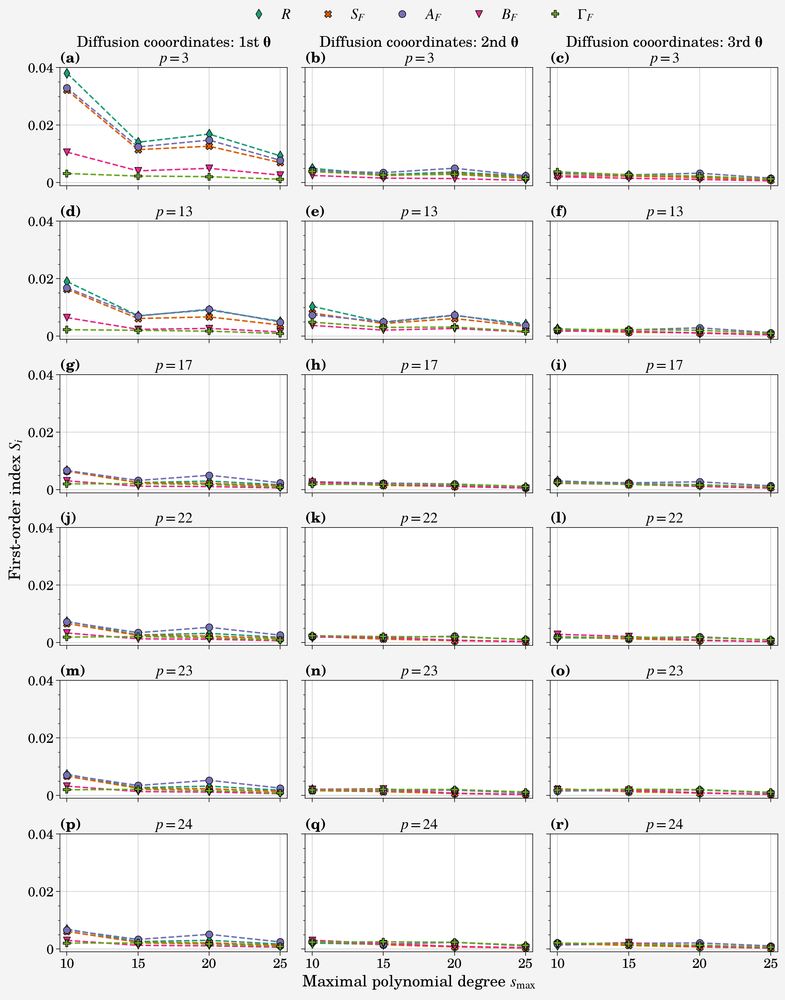

In [33]:
fig, axs = pplt.subplots(ncols=3, nrows=6, figsize=(11, 14), sharex=True)

col1 = np.linspace(0, 15, 6, dtype='int')
col2 = np.linspace(1, 16, 6, dtype='int')
col3 = np.linspace(2, 17, 6, dtype='int')

for row, p in enumerate(p_array):
    for i, param in enumerate(problem['names']):
        vars_at_d1 = []
        vars_at_d2 = []
        vars_at_d3 = []
        for d in max_degree:
            vars_at_d1.append(pce_first_Si_mean_p_d[d][p][:, 0][i])
            vars_at_d2.append(pce_first_Si_mean_p_d[d][p][:, 1][i])
            vars_at_d3.append(pce_first_Si_mean_p_d[d][p][:, 2][i])
                
        axs[col1[row]].scatter(np.linspace(1, 4, 4, dtype='int'), vars_at_d1, 
                               marker=marker_styles[i], label=param_names_short[param], 
                               color=colors[i], edgecolor='k', markersize=50, zorder=3)
        axs[col1[row]].plot(np.linspace(1, 4, 4, dtype='int'), vars_at_d1, 
                            color=colors[i], ls='--')
        axs[col2[row]].scatter(np.linspace(1, 4, 4, dtype='int'), vars_at_d2,
                               marker=marker_styles[i], label=param_names_short[param], 
                               color=colors[i], edgecolor='k', markersize=50, zorder=3)
        axs[col2[row]].plot(np.linspace(1, 4, 4, dtype='int'), vars_at_d2, 
                            color=colors[i], ls='--')
        axs[col3[row]].scatter(np.linspace(1, 4, 4, dtype='int'), vars_at_d3,
                            marker=marker_styles[i], label=param_names_short[param], 
                            color=colors[i], edgecolor='k', markersize=50, zorder=3)
        axs[col3[row]].plot(np.linspace(1, 4, 4, dtype='int'), vars_at_d3,
                            color=colors[i], ls='--')
        
        for ax in axs:
            ax.format(xlim=(0.9, 4.1), ylim=(-0.001, 0.04), 
                      xticklabels=['0', '10', '15', '20', '25'],
                      abc='(a)', xlabel=r'Maximal polynomial degree $s_\max$', 
                      ylabel=r'First-order index $S_i$')
        if row == 0:
            axs[col1[row]].format(title='Diffusion cooordinates: '+ 
                                  r'1st ' +  r"$\mathbf{\theta}$" +'\n'+r'$p={}$'.format(p))
            axs[col2[row]].format(title='Diffusion cooordinates: '+ 
                                  r'2nd ' +  r"$\mathbf{\theta}$" +'\n'+r'$p={}$'.format(p))
            axs[col3[row]].format(title='Diffusion cooordinates: '+ 
                                  r'3rd ' +  r"$\mathbf{\theta}$" +'\n'+r'$p={}$'.format(p))
        else:
            axs[col1[row]].format(title=r'$p={}$'.format(p))
            axs[col2[row]].format(title=r'$p={}$'.format(p))
            axs[col3[row]].format(title=r'$p={}$'.format(p))

fig.legend(param_names_short.values(), ncols=5, frame=False, loc='t',
           fontsize = 15, title_fontsize=15.5) #label='Parameters:'

fig.tight_layout()
plt.savefig('plots/SI/S1_diff_max_size.pdf', bbox_inches='tight')
plt.show()

In [34]:
p_array = [3, 13, 17, 22, 23, 24]
max_degree = [10, 15, 20, 25]

pce_total_Si_mean_p_d = {}
pce_first_Si_mean_p_d = {}
pce_total_Si_var_p_d = {}
pce_first_Si_var_p_d = {}

pce_errorr_mean_d  = np.zeros((len(max_degree), len(p_array), 3))
pce_errorr_std_d = np.zeros((len(max_degree), len(p_array), 3))
pce_errorr_var_d = np.zeros((len(max_degree), len(p_array), 3))

for d_ind, d in enumerate(max_degree):
    pce_total_Si_mean_p = {}
    pce_first_Si_mean_p = {}
    pce_total_Si_var_p = {}
    pce_first_Si_var_p = {}
    
    pce_errorr_mean_p = {}
    pce_errorr_std_p = {}
    pce_errorr_var_p = {}
    
    for p_ind, p in enumerate(p_array):
        file_res = np.load(f'GSA_results/parsim/MAE_PCE{d}/parsim_1024_input_20_runs_MAE_PCE_{d}_p_{p}.npz', 
                           allow_pickle=True)
        pce_total_Si = file_res['x1']
        pce_first_Si = file_res['x2']
        
        pce_errorr_diff_runs = file_res['x11']

        pce_total_Si_mean_p[p] = pce_total_Si.mean(axis=0)
        pce_first_Si_mean_p[p] = pce_first_Si.mean(axis=0)
        pce_total_Si_var_p[p]  = pce_total_Si.var(axis=0, ddof=1)
        pce_first_Si_var_p[p]  = pce_first_Si.var(axis=0, ddof=1)
        
        pce_errorr_mean_d[d_ind, p_ind] = pce_errorr_diff_runs.mean(axis=0)
        pce_errorr_std_d[d_ind, p_ind]  = pce_errorr_diff_runs.std(axis=0, ddof=1)
        pce_errorr_var_d[d_ind, p_ind]  = pce_errorr_diff_runs.var(axis=0, ddof=1)

    pce_total_Si_mean_p_d[d] = pce_total_Si_mean_p
    pce_first_Si_mean_p_d[d] = pce_first_Si_mean_p
    pce_total_Si_var_p_d[d] = pce_total_Si_var_p
    pce_first_Si_var_p_d[d] = pce_first_Si_var_p

In [35]:
ordinal = lambda n: "%d%s" % (n,"tsnrhtdd"[(n//10%10!=1)*(n%10<4)*n%10::4])

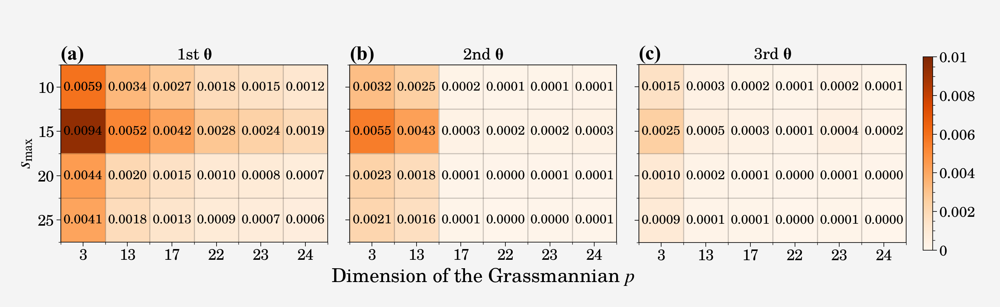

In [36]:
fig, axs = plt.subplots(ncols=3, nrows=1, figsize=(13, 4), sharex=True, sharey=True,
                        gridspec_kw={'width_ratios': [3, 3, 3.76]})

numbering= ['(a)', '(b)', '(c)']
for i in range(3):
    im = axs[i].imshow(pce_errorr_mean_d[:, :, i], vmin=0, vmax=0.01, cmap='Oranges')
    
    axs[i].set_xticks(np.arange(len(p_array)), labels=p_array, size=14)
    axs[i].set_yticks(np.arange(len(max_degree)), labels=max_degree, size=14)

    for row in range(len(max_degree)):
        for col in range(len(p_array)):
            text = axs[i].text(col, row, '%.4f' % pce_errorr_mean_d[:, :, i][row, col],
                               fontsize=12, color='black',
                 horizontalalignment='center',
                 verticalalignment='center')
            
    axs[i].set_xticks(np.arange(-.5, 6, 1), minor=True)
    axs[i].set_yticks(np.arange(-.5, 4, 1), minor=True)

    # Gridlines based on minor ticks
    axs[i].grid(which='minor', color='k', linestyle='-', linewidth=1)
    axs[i].grid(False)
    axs[i].set(title=ordinal(i+1)+r" $\mathbf{\theta}$"+"".format(i+1))
    axs[i].set_title(numbering[i], fontname="Times New Roman", size=19,
                 fontweight="bold", loc='left')
    
    if i==1:
        axs[i].set_xlabel(r'Dimension of the Grassmannian $p$', fontsize=18)
    if i==0:
        axs[i].set_ylabel(r'$s_\max$', fontsize=18)
        
fig.colorbar(im, location='right', shrink=0.70)
plt.tight_layout()
plt.savefig('plots/SI/GDMaps_MAE_mean.pdf', bbox_inches='tight')
plt.show()




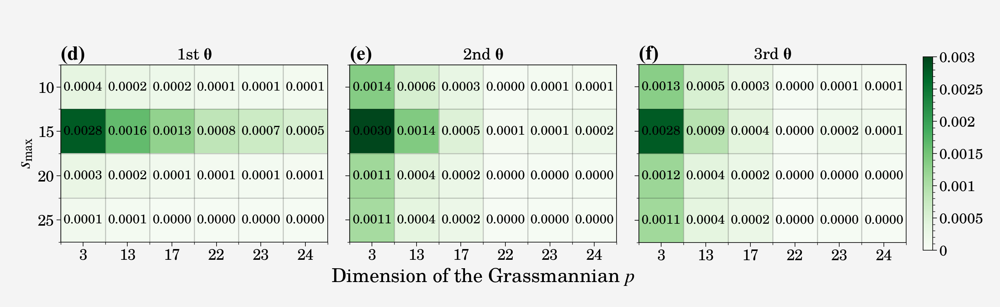

In [37]:
fig, axs = plt.subplots(ncols=3, nrows=1, figsize=(13, 4), sharex=True, sharey=True,
                        gridspec_kw={'width_ratios': [3, 3, 3.76]})

numbering= ['(d)', '(e)', '(f)']
for i in range(3):
    im = axs[i].imshow(pce_errorr_std_d[:, :, i], vmin=0, vmax=0.003, cmap='Greens')
    
    axs[i].set_xticks(np.arange(len(p_array)), labels=p_array, size=14)
    axs[i].set_yticks(np.arange(len(max_degree)), labels=max_degree, size=14)

    for row in range(len(max_degree)):
        for col in range(len(p_array)):
            text = axs[i].text(col, row, '%.4f' % pce_errorr_std_d[:, :, i][row, col],
                               fontsize=12, color='black',
                 horizontalalignment='center',
                 verticalalignment='center')
            
    axs[i].set_xticks(np.arange(-.5, 6, 1), minor=True)
    axs[i].set_yticks(np.arange(-.5, 4, 1), minor=True)

    # Gridlines based on minor ticks
    axs[i].grid(which='minor', color='k', linestyle='-', linewidth=1)
    axs[i].grid(False)
    axs[i].set(title=ordinal(i+1)+r" $\mathbf{\theta}$"+"".format(i+1))
    axs[i].set_title(numbering[i], fontname="Times New Roman", size=19,
                 fontweight="bold", loc='left')
    
    if i==1:
        axs[i].set_xlabel(r'Dimension of the Grassmannian $p$', fontsize=18)
    if i==0:
        axs[i].set_ylabel(r'$s_\max$', fontsize=18)
        
fig.colorbar(im, location='right', shrink=0.70)
fig.tight_layout()
plt.savefig('plots/SI/GDMaps_MAE_std.pdf', bbox_inches='tight')
plt.show()

In [38]:
p_array = [3, 13, 17, 22, 23, 24]
max_degree = [10, 15, 20, 25]

pce_total_Si_mean_p_d = {}
pce_first_Si_mean_p_d = {}
pce_total_Si_var_p_d = {}
pce_first_Si_var_p_d = {}

pce_errorr_mean_d  = np.zeros((len(max_degree), len(p_array), 3))
pce_errorr_std_d = np.zeros((len(max_degree), len(p_array), 3))
pce_errorr_var_d = np.zeros((len(max_degree), len(p_array), 3))

for d_ind, d in enumerate(max_degree):
    pce_total_Si_mean_p = {}
    pce_first_Si_mean_p = {}
    pce_total_Si_var_p = {}
    pce_first_Si_var_p = {}
    
    pce_errorr_mean_p = {}
    pce_errorr_std_p = {}
    pce_errorr_var_p = {}
    
    for p_ind, p in enumerate(p_array):
        file_res = np.load(f'GSA_results/nonparsim/PCE{d}/nonparsim_1024_input_20_runs_PCE_{d}_p_{p}.npz', 
                           allow_pickle=True)
        pce_total_Si = file_res['x1']
        pce_first_Si = file_res['x2']
        
        pce_errorr_diff_runs = file_res['x11']

        pce_total_Si_mean_p[p] = pce_total_Si.mean(axis=0)
        pce_first_Si_mean_p[p] = pce_first_Si.mean(axis=0)
        pce_total_Si_var_p[p]  = pce_total_Si.var(axis=0, ddof=1)
        pce_first_Si_var_p[p]  = pce_first_Si.var(axis=0, ddof=1)
        
        pce_errorr_mean_d[d_ind, p_ind] = pce_errorr_diff_runs.mean(axis=0)
        pce_errorr_std_d[d_ind, p_ind]  = pce_errorr_diff_runs.std(axis=0, ddof=1)
        pce_errorr_var_d[d_ind, p_ind]  = pce_errorr_diff_runs.var(axis=0, ddof=1)

    pce_total_Si_mean_p_d[d] = pce_total_Si_mean_p
    pce_first_Si_mean_p_d[d] = pce_first_Si_mean_p
    pce_total_Si_var_p_d[d] = pce_total_Si_var_p
    pce_first_Si_var_p_d[d] = pce_first_Si_var_p



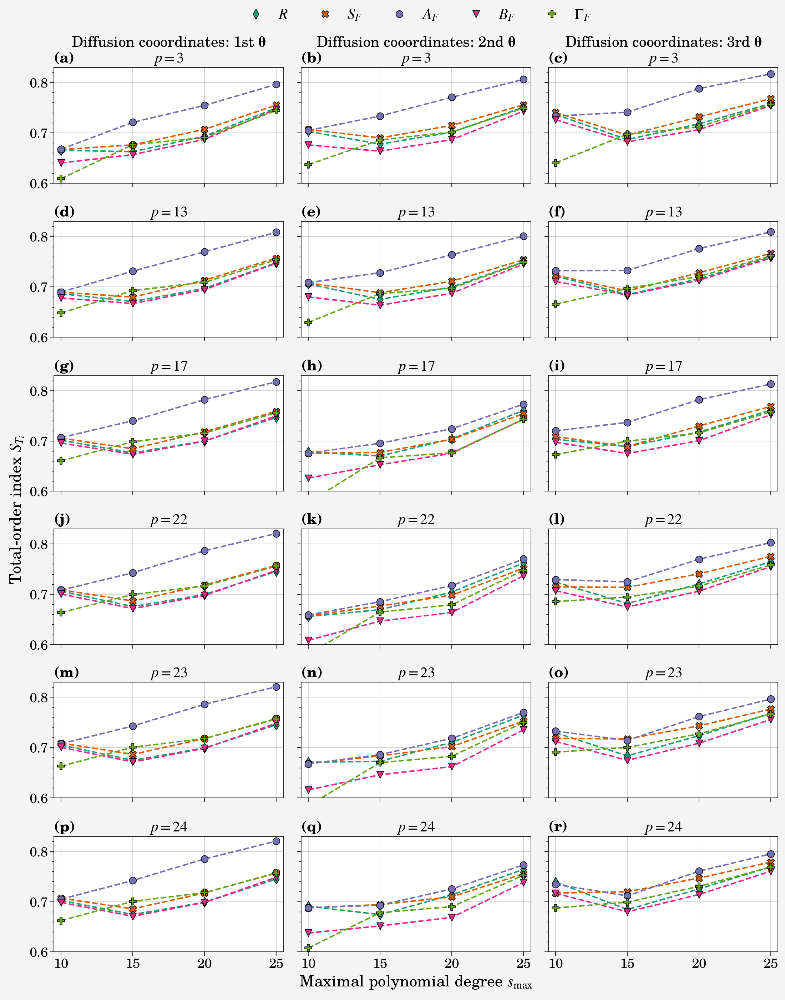

In [39]:
fig, axs = pplt.subplots(ncols=3, nrows=6, figsize=(11, 14), sharex=True)

col1 = np.linspace(0, 15, 6, dtype='int')
col2 = np.linspace(1, 16, 6, dtype='int')
col3 = np.linspace(2, 17, 6, dtype='int')

# param_styles = ['d--', 'X--', 'o--',  'v--', 'P--', 's--','*--']
marker_styles = ['d', 'X','o', 'v', 'P', 's', '*']
colors=mcp.gen_color(cmap="Dark2",n=9)

for row, p in enumerate(p_array):
    for i, param in enumerate(problem['names']):
        vars_at_d1 = []
        vars_at_d2 = []
        vars_at_d3 = []
        for d in max_degree:
            vars_at_d1.append(pce_total_Si_mean_p_d[d][p][:, 0][i])
            vars_at_d2.append(pce_total_Si_mean_p_d[d][p][:, 1][i])
            vars_at_d3.append(pce_total_Si_mean_p_d[d][p][:, 2][i])
            
        axs[col1[row]].scatter(np.linspace(1, 4, 4, dtype='int'), vars_at_d1, 
                               marker=marker_styles[i], label=param_names_short[param], 
                               color=colors[i], edgecolor='k', markersize=50, zorder=3)
        axs[col1[row]].plot(np.linspace(1, 4, 4, dtype='int'), vars_at_d1, 
                            color=colors[i], ls='--')
        axs[col2[row]].scatter(np.linspace(1, 4, 4, dtype='int'), vars_at_d2,
                               marker=marker_styles[i], label=param_names_short[param], 
                               color=colors[i], edgecolor='k', markersize=50, zorder=3)
        axs[col2[row]].plot(np.linspace(1, 4, 4, dtype='int'), vars_at_d2, 
                            color=colors[i], ls='--')
        axs[col3[row]].scatter(np.linspace(1, 4, 4, dtype='int'), vars_at_d3,
                            marker=marker_styles[i], label=param_names_short[param], 
                            color=colors[i], edgecolor='k', markersize=50, zorder=3)
        axs[col3[row]].plot(np.linspace(1, 4, 4, dtype='int'), vars_at_d3,
                            color=colors[i], ls='--')
        for ax in axs:
            ax.format(xlim=(0.9, 4.1), ylim=(0.6, 0.83), 
                      xticklabels=['0', '10', '15', '20', '25'],
                      abc='(a)', xlabel=r'Maximal polynomial degree $s_\max$', 
                      ylabel=r'Total-order index $S_{T_i}$')
        if row == 0:
            axs[col1[row]].format(title='Diffusion cooordinates: '+ 
                                  r'1st ' +  r"$\mathbf{\theta}$" +'\n'+r'$p={}$'.format(p))
            axs[col2[row]].format(title='Diffusion cooordinates: '+ 
                                  r'2nd ' +  r"$\mathbf{\theta}$" +'\n'+r'$p={}$'.format(p))
            axs[col3[row]].format(title='Diffusion cooordinates: '+ 
                                  r'3rd ' +  r"$\mathbf{\theta}$" +'\n'+r'$p={}$'.format(p))
        else:
            axs[col1[row]].format(title=r'$p={}$'.format(p))
            axs[col2[row]].format(title=r'$p={}$'.format(p))
            axs[col3[row]].format(title=r'$p={}$'.format(p))

fig.legend(param_names_short.values(), ncols=5, frame=False, loc='t',
           fontsize = 15, title_fontsize=15.5)

fig.tight_layout()
plt.savefig('plots/SI/ST_diff_max_size_nonparsim.pdf', bbox_inches='tight')
plt.show()
    